# Food Access in DC Midterm
Maps produced by Rachel Seiberg

For the midterm, I created two static maps and one interactive map. My first static map displays the distribution of black residents throughout the city of Washington D.C. based on census tracts. My second static map visualizes low food access areas in the city of Washington D.C. My interactive map illustrates all grocery and healthy corner stores in the city based on percent black census tracts. The interactive map has a draggable legend, has hover data that shows the name of the store, and stores are color coded as either grocery stores or corner stores in the legend.

Before I get started, I need to import relevant data libraries

In [1]:
import pandas as pd
import geopandas as gpd
import folium
import matplotlib.pyplot as plt
import contextily as ctx

# Cleaning up the data
## Open Data DC - Data on Food (Grocery Stores and Healthy Corner Stores)
First, I need to explore my data and trim it to make sure that I can merge data where needed

In [2]:
gsl = pd.read_csv('Grocery_Store_Locations.csv') # import the data

In [3]:
gsl.shape # tells me how many rows and columns in the data set

(82, 36)

In [4]:
gsl.head()

,X,Y,STORENAME,ADDRESS,ZIPCODE,PHONE,WARD,SSL,NOTES,PRESENT90,...,XCOORD,YCOORD,MAR_ID,SE_ANNO_CAD_DATA,GLOBALID,CREATOR,CREATED,EDITOR,EDITED,PRESENT22
0,-77.026981,38.984455,Target,7828 GEORGIA AVENUE NW,20012,2028923822,Ward 4,2960 0017,NaN,NaN,...,397662.57,146280.07,300512,NaN,{CE302122-4E8D-4DC7-845B-06563B993F66},JLAY,2022/09/28 18:04:54+00,JLAY,2022/09/28 18:04:54+00,Yes
1,-77.026066,38.983464,International Progresso Market,7719 GEORGIA AVENUE NW,20012,2025455015,Ward 4,2961 0810,NaN,NaN,...,397741.80,146169.97,285417,NaN,{2C18863D-40DE-4F66-AA59-46F1C65D67F2},JLAY,2022/09/28 18:04:54+00,JLAY,2022/09/28 18:04:54+00,Yes
2,-77.027798,38.967771,Jocelyn’s Market,6404 GEORGIA AVENUE NW,20012,2027227574,Ward 4,2945 0839,NaN,NaN,...,397591.16,144428.00,285334,NaN,{A0B448C3-B3FB-49FE-B8BF-1FEBA3CEA642},JLAY,2022/09/28 18:04:54+00,JLAY,2022/09/28 18:04:54+00,Yes
3,-77.076459,38.965553,Magruder's,5626 CONNECTICUT AVENUE NW,20015,2024644946,Ward 3,1860 0013,,Yes,...,393373.92,144184.19,263860,NaN,{9ABE1C46-BB48-4110-B5BA-C6363CA3BD7A},JLAY,2022/09/28 18:04:54+00,JLAY,2022/09/28 18:04:54+00,Yes
4,-77.074910,38.964601,Safeway,5545 CONNECTICUT AVENUE NW,20015,2022446097,Ward 3,1867 0092,,No,...,393508.13,144078.34,263999,NaN,{902F540E-FE16-43A5-8010-CD84E94B28B7},JLAY,2022/09/28 18:04:54+00,JLAY,2022/09/28 18:04:54+00,Yes


Let's see all of the columns:

In [5]:
gsl.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 82 entries, 0 to 81
Data columns (total 36 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   X                 82 non-null     float64
 1   Y                 82 non-null     float64
 2   STORENAME         82 non-null     object 
 3   ADDRESS           82 non-null     object 
 4   ZIPCODE           82 non-null     int64  
 5   PHONE             82 non-null     int64  
 6   WARD              82 non-null     object 
 7   SSL               82 non-null     object 
 8   NOTES             53 non-null     object 
 9   PRESENT90         55 non-null     object 
 10  PRESENT95         55 non-null     object 
 11  PRESENT00         55 non-null     object 
 12  PRESENT05         55 non-null     object 
 13  PRESENT08         55 non-null     object 
 14  PRESENT09         55 non-null     object 
 15  PRESENT10         55 non-null     object 
 16  PRESENT11         55 non-null     object 
 17 

I want to create a new column called "store type" because I'm planning to merge this data set with the Open Data DC data set on healthy corner stores. I'm hoping to distinguish between these store types in my map later, so I need to add this new column, with all entries being "grocery store" since these are all from the grocery store location data set.

In [6]:
gsl['STORE TYPE']= 'Grocery store' # create a new column "store type"

Next, I need to trim the grocery store location data to keep only relevant columns that I may use later on when mapping. I also must make a new data frame (gsl_trimmed) as a copy of the original data frame, gsl

In [7]:
# subset the data
desired_columns= ['X','Y','STORENAME','WARD', 'STORE TYPE']
gsl_trimmed = gsl[desired_columns].copy()
gsl_trimmed = gsl_trimmed.dropna()
gsl_trimmed.sample(1)

,X,Y,STORENAME,WARD,STORE TYPE
57,-76.998147,38.900404,Whole Foods,Ward 6,Grocery store


I'm going to repeat this same process with healthy corner stores, because I hope to merge these two data sets to build a data set that reflects access to healthy foods

In [8]:
healthy= pd.read_csv('Healthy_Corner_Stores.csv') # import healthy corner store data

In [9]:
healthy.shape # tells me how many rows and columns in the data set

(71, 17)

In [10]:
healthy.head()

,X,Y,OBJECTID,STORE,ADDRESS,XCOORD,YCOORD,MATCHTYPE,MAR_ID,LATITUDE,LONGITUDE,GIS_ID,GLOBALID,CREATOR,CREATED,EDITOR,EDITED
0,-77.019079,38.975046,1,BP Blaire Gas Station,7000 Blair Rd NW,398346.95,145235.41,Exact,249127.0,38.975039,-77.019077,HealthyCornerStorePt_1,{F6CD05AE-1648-404D-B7A3-603BE5E3361B},NaN,NaN,NaN,NaN
1,-77.028431,38.961525,2,Missouri Avenue Market,5900 Georgia Ave NW,397536.12,143734.68,Exact,253189.0,38.961518,-77.028429,HealthyCornerStorePt_2,{87C1AAA2-139C-4A8D-AA34-DF7A3AA1312C},NaN,NaN,NaN,NaN
2,-77.010355,38.956438,3,Capital View Convenience Store,12 Kennedy St NW,399102.65,143169.61,Exact,283923.0,38.956431,-77.010353,HealthyCornerStorePt_3,{77D178A5-1D12-492B-A96C-5D0FFC242C97},NaN,NaN,NaN,NaN
3,-77.027749,38.955825,4,S&G Liquor and Grocery,5421 Georgia Ave NW,397595.00,143101.81,Exact,254615.0,38.955817,-77.027747,HealthyCornerStorePt_4,{D8EB793F-418B-43A8-843B-DA0CFACA0832},NaN,NaN,NaN,NaN
4,-77.020196,38.955826,5,Starlight Food,5424 5th St NW,0.00,0.00,Manual,NaN,NaN,NaN,HealthyCornerStorePt_5,{1DA97531-D58F-4F82-9D9B-4071D1B7B361},NaN,NaN,NaN,NaN


In [11]:
healthy.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 71 entries, 0 to 70
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   X          71 non-null     float64
 1   Y          71 non-null     float64
 2   OBJECTID   71 non-null     int64  
 3   STORE      71 non-null     object 
 4   ADDRESS    71 non-null     object 
 5   XCOORD     71 non-null     float64
 6   YCOORD     71 non-null     float64
 7   MATCHTYPE  71 non-null     object 
 8   MAR_ID     68 non-null     float64
 9   LATITUDE   68 non-null     float64
 10  LONGITUDE  68 non-null     float64
 11  GIS_ID     71 non-null     object 
 12  GLOBALID   71 non-null     object 
 13  CREATOR    0 non-null      float64
 14  CREATED    0 non-null      float64
 15  EDITOR     0 non-null      float64
 16  EDITED     0 non-null      float64
dtypes: float64(11), int64(1), object(5)
memory usage: 9.6+ KB


Change the column title "store".

Let's run a head to make sure it worked

In [12]:
# rename "store" to "storename" to be consistent with gsl data for merging
healthy.rename(columns={'STORE':'STORENAME'}, inplace=True)
healthy.head(1)

,X,Y,OBJECTID,STORENAME,ADDRESS,XCOORD,YCOORD,MATCHTYPE,MAR_ID,LATITUDE,LONGITUDE,GIS_ID,GLOBALID,CREATOR,CREATED,EDITOR,EDITED
0,-77.019079,38.975046,1,BP Blaire Gas Station,7000 Blair Rd NW,398346.95,145235.41,Exact,249127.0,38.975039,-77.019077,HealthyCornerStorePt_1,{F6CD05AE-1648-404D-B7A3-603BE5E3361B},NaN,NaN,NaN,NaN


Like I did previously with gsl data, I'm adding a new column "store type" and listing all of the rows in this data set as healthy corner stores. This will help me distinguish from grocery store locations later on when I merge the data and map it

In [13]:
healthy['STORE TYPE']= 'Healthy corner store' # add a new column with the input "healthy corner store"

Like with grocery store locations, I only need a few relevant columns, so I'll trim the data accordingly

In [14]:
# subset the data
desired_columns_healthy= ['X','Y','STORENAME','STORE TYPE'] # only keep the necessary columns
healthy[desired_columns_healthy].sample(3)
healthy_trimmed = healthy[desired_columns_healthy].copy()
healthy_trimmed = healthy_trimmed.dropna()
healthy_trimmed.sample(3)

,X,Y,STORENAME,STORE TYPE
9,-76.959916,38.929825,Dollar Plus Food Store (Bladensburg Rd.),Healthy corner store
69,-76.998293,38.829006,Chesapeake Big Market,Healthy corner store
55,-76.984830,38.866908,New Seven Market,Healthy corner store


Next, I will merge the two data sets I just trimmed (grocery store locations and healthy corner stores) because I'm hoping to map both of these data sets together

In [15]:
all_stores= pd.concat([gsl_trimmed, healthy_trimmed], axis=0) # merge the data using the concatenation function

In [16]:
all_stores.sample(3) # make sure the concatenation worked

,X,Y,STORENAME,WARD,STORE TYPE
36,-76.925528,38.897872,A-1 Grocery,NaN,Healthy corner store
41,-77.038956,38.912058,Safeway,Ward 2,Grocery store
52,-76.978032,38.901569,Aldi,Ward 5,Grocery store


Yay it worked!

Okay I'm nervous that this is only a sample. Because I'm neurotic I'll check out the shape and see if the number of rows and columns checks out

In [17]:
all_stores.shape

(153, 5)

Yay again!

Finally, I can move on!

## Census Data on Race/Ethnicity and Census Tracts

I'm going to add in my census data from Social Explorer to layer with my DC data on grocery stores.

I'll replicate some of the processes I did previously for DC data, such as trimming and merging the data. However, I'll add some extra steps to merge the census tracts (geojson) with race/ethnicity data (csv).

In [18]:
tracts=gpd.read_file('Census_Tracts_in_2020.geojson') #import census tracts and check it out!
tracts.head(2)

,OBJECTID,TRACT,GEOID,P0010001,P0010002,P0010003,P0010004,P0010005,P0010006,P0010007,...,P0050004,P0050005,P0050006,P0050007,P0050008,P0050009,P0050010,SHAPEAREA,SHAPELEN,geometry
0,1,002002,11001002002,4072,3647,1116,1751,27,84,0,...,0,0,0,32,0,0,32,0,0,"POLYGON ((-77.03642 38.94975, -77.03643 38.948..."
1,2,002101,11001002101,5687,5071,1037,2642,86,120,1,...,0,0,0,31,0,0,31,0,0,"POLYGON ((-77.02824 38.95813, -77.02824 38.958..."


I only need two columns from the census tracts, so I'll trim the data to keep those two columns

In [19]:
tracts_trimmed=['GEOID','geometry'] #trim the data, keeping only relevant columns

Next, I'll add in my race/ethnicity data for the City of Washington D.C. from Social Explorer

In [20]:
race= pd.read_csv('census_race_ethnicity_2020.csv') # import the data

I already cleaned up this data previously. When I cleaned it, I saw that Python had removed the 0's from Geo_COUNTY. So, I'm going to convert the FIPS columns to a string

In [21]:
# convert the necessary FIPS columns to string
race= pd.read_csv(
    'census_race_ethnicity_2020.csv',
    dtype=
    {
        'Geo_FIPS':str,
        'Geo_STATE':str,
        'Geo_COUNTY':str
    }
)

To trim my data, I want to delete columns that have all empty values.

In [22]:
race=race.dropna(axis=1,how="all") # drop all empty values

I don't need all of the columns in the race/ethnicity data set, so I'll select the columns I need. These columns are the FIPS column and all of the race/ethnicity categories

In [23]:
# trim the data to keep relevant columns
columns_to_keep=['Geo_FIPS',
                 'SE_A04001_001',
                 'SE_A04001_002',
                 'SE_A04001_003',
                 'SE_A04001_004',
                 'SE_A04001_005',
                 'SE_A04001_006',
                 'SE_A04001_007',
                 'SE_A04001_008',
                 'SE_A04001_009',
                 'SE_A04001_010',
                 'SE_A04001_011',
                 'SE_A04001_012',
                 'SE_A04001_013',
                 'SE_A04001_014',
                 'SE_A04001_015',
                 'SE_A04001_016',
                 'SE_A04001_017',]

In [24]:
race2 = race[columns_to_keep] #create new data frame with trimmed data
race2

,Geo_FIPS,SE_A04001_001,SE_A04001_002,SE_A04001_003,SE_A04001_004,SE_A04001_005,SE_A04001_006,SE_A04001_007,SE_A04001_008,SE_A04001_009,SE_A04001_010,SE_A04001_011,SE_A04001_012,SE_A04001_013,SE_A04001_014,SE_A04001_015,SE_A04001_016,SE_A04001_017
0,11001000101,1250,1099,1029,0,0,54,0,14,2,151,149,0,0,0,0,0,2
1,11001000102,3318,2931,2700,34,0,150,0,12,35,387,168,0,0,0,0,135,84
2,11001000201,3972,3519,2200,239,25,894,0,0,161,453,285,8,0,0,0,92,68
3,11001000202,4665,4298,3728,131,0,285,18,0,136,367,193,11,0,0,0,129,34
4,11001000300,6504,5693,5017,178,0,379,0,38,81,811,569,0,0,0,0,0,242
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
201,11001010900,3400,3359,53,2863,0,12,0,0,431,41,0,17,0,0,0,0,24
202,11001011001,2345,1997,1097,764,0,29,0,0,107,348,348,0,0,0,0,0,0
203,11001011002,1760,1676,1197,342,0,40,0,0,97,84,50,0,0,0,0,31,3
204,11001011100,5227,4073,506,3273,11,138,0,9,136,1154,276,254,0,0,0,274,350


The column names aren't user friendly, so I will rename the columns

In [25]:
race2.columns= ['FIPS',
                'Total Population',
                'Not Hispanic or Latino',
                'Not Hispanic or Latino White Alone',
                'Not Hispanic or Latino Black Alone',
                'Not Hispanic or Latino American Indian and Alaska Native Alone',
                'Not Hispanic or Latino Asian Alone',
                'Not Hispanic or Latino Native Hawaiian and other Pacific Islander Alone',
                'Not Hispanic or Latino Some Other Race Alone',
                'Not Hispanic or Latino Two or More Races',
                'Hispanic or Latino',
                'Hispanic or Latino White Alone',
                'Hispanic or Latino Black Alone',
                'Hispanic or Latino American Indian and Alaska Native Alone',
                'Hispanic or Latino Asian Alone',
                'Hispanic or Latino Native Hawaiian and other Pacific Islander Alone',
                'Hispanic or Latino Some Other Race Alone',
                'Hispanic or Latino Two or More Races']

Next, I need to create a new column titled 'FIPS'. Since Geojson doesn't provide the state and county numbers for the FIPS code, I am adding them in front of the tract number, both as strings (aka objects).

In [26]:
tracts['FIPS'] ='11' + '001' + tracts['TRACT'] #creating the new column with the state and county numbers
tracts.head(2)

,OBJECTID,TRACT,GEOID,P0010001,P0010002,P0010003,P0010004,P0010005,P0010006,P0010007,...,P0050005,P0050006,P0050007,P0050008,P0050009,P0050010,SHAPEAREA,SHAPELEN,geometry,FIPS
0,1,002002,11001002002,4072,3647,1116,1751,27,84,0,...,0,0,32,0,0,32,0,0,"POLYGON ((-77.03642 38.94975, -77.03643 38.948...",11001002002
1,2,002101,11001002101,5687,5071,1037,2642,86,120,1,...,0,0,31,0,0,31,0,0,"POLYGON ((-77.02824 38.95813, -77.02824 38.958...",11001002101


Next, I will merge the census data from social explorer with my census tracts from geojson

In [27]:
tracts_race=tracts.merge(race2,on='FIPS')
tracts_race.head(2)

,OBJECTID,TRACT,GEOID,P0010001,P0010002,P0010003,P0010004,P0010005,P0010006,P0010007,...,Not Hispanic or Latino Some Other Race Alone,Not Hispanic or Latino Two or More Races,Hispanic or Latino,Hispanic or Latino White Alone,Hispanic or Latino Black Alone,Hispanic or Latino American Indian and Alaska Native Alone,Hispanic or Latino Asian Alone,Hispanic or Latino Native Hawaiian and other Pacific Islander Alone,Hispanic or Latino Some Other Race Alone,Hispanic or Latino Two or More Races
0,1,002002,11001002002,4072,3647,1116,1751,27,84,0,...,0,95,978,329,0,0,0,0,277,372
1,2,002101,11001002101,5687,5071,1037,2642,86,120,1,...,0,128,1266,249,130,0,0,0,812,75


In order to visualize racial/ethnic distribution in the City of Washington D.C., I need to find the percentages of the racial groups of interest in relation to the total population.

In [28]:
# creating percentages for black and white populations in relation to total population
tracts_race['PCT_Black'] = tracts_race['Not Hispanic or Latino Black Alone']/tracts_race['Total Population']*100
tracts_race['PCT_White'] = tracts_race['Not Hispanic or Latino White Alone']/tracts_race['Total Population']*100

# Mapping!

## Mapping black population in Washington D.C. by census tract in 2020

I'm now ready to visualize the data!

I need to double check the web projection of the my merged census tract/ race and ethnicity data to see if it's synonymous with the folium basemap

In [29]:
tracts_race.crs #check projection

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

Turns out it's in the wrong projection! So let's change that

In [30]:
tracts_race_wm = tracts_race.to_crs(epsg=3857) #change projection

Finally, I can make my map!

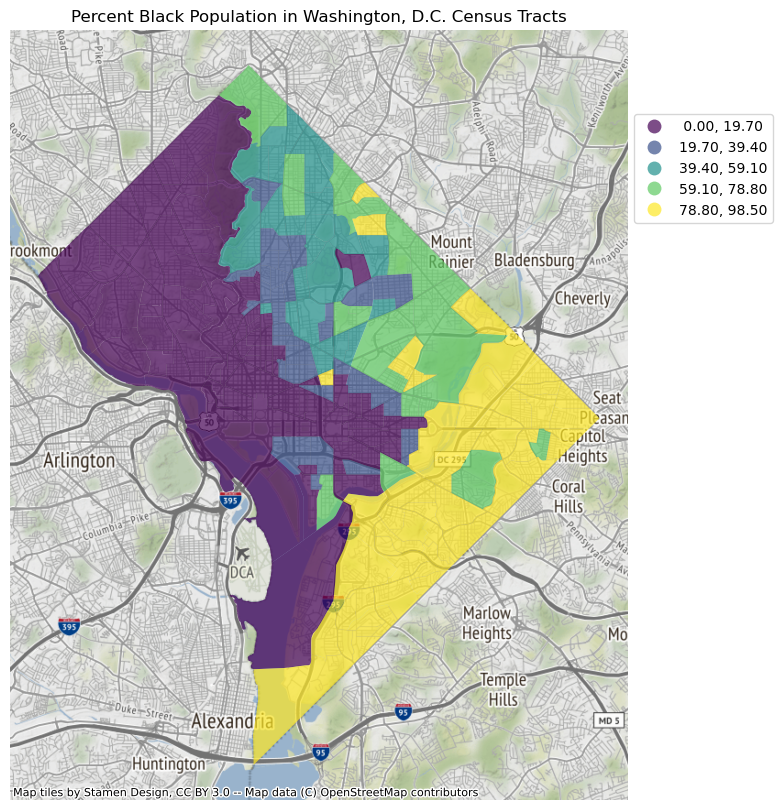

In [31]:
fig, ax = plt.subplots(figsize=(10,10))
tracts_race_wm.plot(figsize=(12,10), # plot the data
                 column='PCT_Black',
                 legend=True, 
                 ax=ax,
                 legend_kwds={'loc':'upper left','bbox_to_anchor':(1,.9)},
                 scheme='equal_interval', alpha=0.7)
ax.set_title('Percent Black Population in Washington, D.C. Census Tracts') # set axis title
ctx.add_basemap(ax) # add basemap 
ax.set_axis_off() # remove axis

This map shows that the SE quadrant of D.C. has a noticably high concentration of black people. There is a clear divide between east and west, in which there are significantly more black individuals living in the eastern region of the city.

## Mapping store locations (grocery stores and healthy corner stores) in D.C. based on percent black population

I'm going to create an interactive Choropleth map based on percent black population. I'm going to also add the all_stores data (grocery stores and healthy corner stores) and create a legend to distinguish between the two

First, I'll import my basemap from folium

In [32]:
m = folium.Map(location=[38.9072, -77.0369], 
               zoom_start = 9,
               tiles='CartoDB positron', 
               attribution='CartoDB')
m

Next, I'll use a for loop to add markers to the store locations so that I can map them

In [33]:
for index, row in all_stores.iterrows():
    print(row.STORENAME, row.X, row.Y)

Target  -77.0269805790129 38.9844552988866
International Progresso Market -77.0260657546085 38.9834637018227
Jocelyn’s Market  -77.0277982734047 38.9677712350042
Magruder's -77.0764593007974 38.9655532402862
Safeway -77.0749096653148 38.9646007197834
Walmart Supercenter -77.0272851396928 38.962078321939
Walmart Supercenter -77.0021444681289 38.9579766930922
Tropimart International Foods -77.0213178876896 38.9566042517642
Rodman’s  -77.0838608276822 38.9563029882965
Avenue Market -77.0123007836538 38.9514161546653
Whole Foods -77.0792147083642 38.9491088872299
Target  -77.080552496299 38.9485365777595
Wagshal’s Market  -77.0957591117584 38.9457215516
Giant -77.0631725104573 38.9445067759354
Yes! Organic -77.0255289707541 38.9410364720762
Morazan Grocery Store -77.0330336144517 38.9394468802695
Yes! Organic -76.9903974420661 38.9368242449082
Target  -77.0580161995249 38.9358594136603
Streets Market -77.0578868641251 38.9352427693639
Yes! Organic -77.0577904942142 38.9351664266393
Giant -

Next, I'll first develop a Choropleth map that is interactive, projecting percent black census tracts in Washington D.C.

In [34]:
# create choropleth map for percent black population in census tracts
folium.Choropleth(
                  geo_data=tracts_race, 
                  data=tracts_race,         
                  key_on='feature.properties.FIPS', 
                  columns=['FIPS', 'PCT_Black'], 
                  fill_color='PuBuGn',
                  line_weight=0.1, 
                  fill_opacity=0.8,
                  line_opacity=0.2,
                  legend_kwds={'loc':'upper left','bbox_to_anchor':(1,.9)},
                  legend_name='Percent Black').add_to(m)
m

Fun! But I wanted to add the store locations...

I'll use a for loop to do this. But this time, rather than using the merged data (all_stores), I'm going to play it safe to ensure that the markers are different colors based on store type. So, I'll use the trimmed gsl and healthy stores data sets and set different colors to their markers

In [35]:
for index, row in gsl_trimmed.iterrows():
    folium.Marker([row.Y, row.X], popup=row.STORENAME, tooltip=row.STORENAME, icon=folium.Icon(color='white',icon_color='black')).add_to(m)
for index, row in healthy_trimmed.iterrows():
    folium.Marker([row.Y, row.X], popup=row.STORENAME, tooltip=row.STORENAME, icon=folium.Icon(color='black')).add_to(m)
m

If I have different color markers, I definitely need a legend.

It'd be fun if the legend was draggable 

In [36]:
# create a legend
from branca.element import Template, MacroElement

template = """
{% macro html(this, kwargs) %}

<!doctype html>
<html lang="en">
<head>
  <meta charset="utf-8">
  <meta name="viewport" content="width=device-width, initial-scale=1">
  <title>jQuery UI Draggable - Default functionality</title>
  <link rel="stylesheet" href="//code.jquery.com/ui/1.12.1/themes/base/jquery-ui.css">

  <script src="https://code.jquery.com/jquery-1.12.4.js"></script>
  <script src="https://code.jquery.com/ui/1.12.1/jquery-ui.js"></script>
  
  <script>
  $( function() {
    $( "#maplegend" ).draggable({
                    start: function (event, ui) {
                        $(this).css({
                            right: "auto",
                            top: "auto",
                            bottom: "auto"
                        });
                    }
                });
});

  </script>
</head>
<body>

 
<div id='maplegend' class='maplegend' 
    style='position: absolute; z-index:9999; border:2px solid grey; background-color:rgba(255, 255, 255, 0.8);
     border-radius:6px; padding: 10px; font-size:14px; right: 20px; bottom: 20px;'>
     
<div class='legend-title'>Legend (draggable!)</div>
<div class='legend-scale'>
  <ul class='legend-labels'>
    <li><span style='background:white;opacity:0.7;'></span>Grocery Stores</li>
    <li><span style='background:Black;opacity:0.7;'></span>Healthy Corner Stores</li>

  </ul>
</div>
</div>
 
</body>
</html>

<style type='text/css'>
  .maplegend .legend-title {
    text-align: left;
    margin-bottom: 5px;
    font-weight: bold;
    font-size: 90%;
    }
  .maplegend .legend-scale ul {
    margin: 0;
    margin-bottom: 5px;
    padding: 0;
    float: left;
    list-style: none;
    }
  .maplegend .legend-scale ul li {
    font-size: 80%;
    list-style: none;
    margin-left: 0;
    line-height: 18px;
    margin-bottom: 2px;
    }
  .maplegend ul.legend-labels li span {
    display: block;
    float: left;
    height: 16px;
    width: 30px;
    margin-right: 5px;
    margin-left: 0;
    border: 1px solid #999;
    }
  .maplegend .legend-source {
    font-size: 80%;
    color: #777;
    clear: both;
    }
  .maplegend a {
    color: #777;
    }
</style>
{% endmacro %}"""

macro = MacroElement()
macro._template = Template(template)

m.get_root().add_child(macro)

m

Yay! This map shows the store locations, differentiated between grocery stores and healthy corner stores by color, in Washington D.C. I can see that the map highlights black populations by census tracts. This helps me understand the spatial distribution of different types of food access for black communities.

I can see that there are way more healthy corner stores, which are likely less accessible (since they're more expensive) and far fewer full-fledged grocery stores in areas with high concentrations of black people. This is grounds for me to probe the question further if there is a food disparity in D.C. based on race and ethnicity.

## Mapping food access in Washington D.C.

Finally, I'm very interested to see visualize low food access areas in D.C. based on what I've just mapped. I can expect more low food access areas in east D.C., especially the SE quadrant, where I've identified less grocery stores.

I forgot to import/ clean the low food access areas data before, so I'll do it now

In [37]:
lfa=gpd.read_file('Low_Food_Access_Areas.geojson') # import data

I had trouble last week looking at this data set but now I know about web projections. Let's see what the data set is projected in

In [38]:
lfa.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

Makes sense why I had trouble last week... I need to change the projection!

In [39]:
lfa_wm = lfa.to_crs(epsg=3857) # change projection

And now, I get to map the data

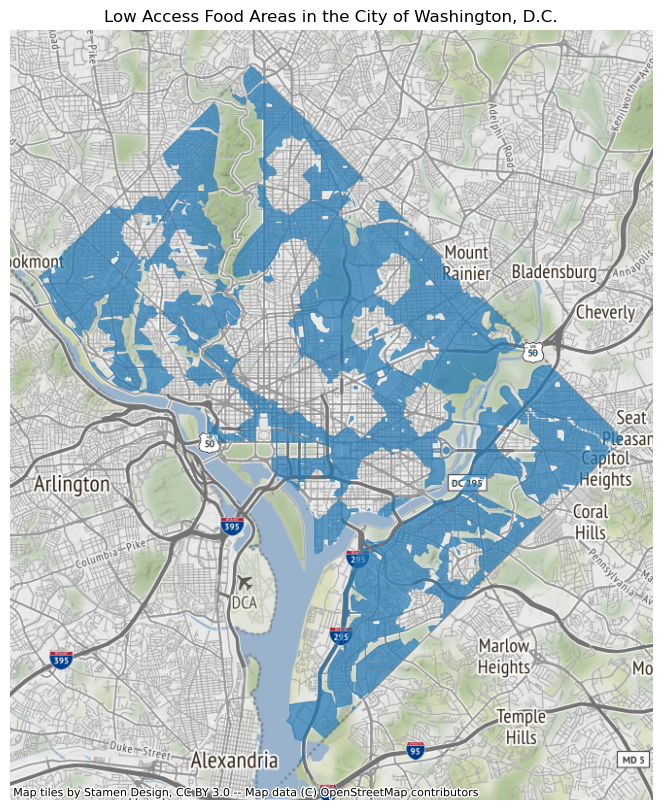

In [40]:
fig, ax = plt.subplots(figsize=(10,10))
lfa_wm.plot(figsize=(12,10),
                 legend=True, 
                 ax=ax,
                 legend_kwds={'loc':'upper left','bbox_to_anchor':(1,.9)},
                 scheme='equal_interval', alpha=0.7)
ax.set_title('Low Access Food Areas in the City of Washington, D.C.')
ctx.add_basemap(ax)
ax.set_axis_off()

The distribution of low food access areas is a not as stark as I would have thought. There isn't as obvious of a disparity in food access as I expected, since there's certainly dispersion of low food access across the city. However, it seems like there are more low food access areas in the eastern part of D.C., as I hypothesized. This makes sense, with its higher black population and lower count of grocery stores.

NB viewer link:
https://nbviewer.org/github/rseiberg/food_access_dc/blob/main/Group%20Assignments/Week%205_midterm/Rachel%20S%20midterm%20notebook.ipynb